<a href="https://colab.research.google.com/github/danon6868/BI-ml-2023/blob/main/lecture_9_10_cnn/lecture/finetune_lecture_ans.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from IPython.display import clear_output
import json
from glob import glob
from PIL import Image
from torch.utils.data import Dataset
from torchvision import transforms, datasets
from torchvision.transforms import Compose
from torch import nn
import os
import torch
import torchvision
import time

In [2]:
import torch
import random
import numpy as np


torch.manual_seed(42)
random.seed(42)
np.random.seed(42)


DEVICE = "cpu"

In [3]:
print(DEVICE)

cpu


In [4]:
import csv
import pandas as pd

labels_df = pd.read_csv('labels.csv')
labels_df.shape

(10222, 2)

In [5]:
# Раскладывание данных по директориям, соответствующим классу; производилось однократно
#train_images = os.listdir('train')
#val_images = random.sample(train_images, 1000)
#
#for val_image in val_images:
#    path_from = os.path.join('train', val_image)
#    path_to = os.path.join('val', val_image)
#    !mv {path_from} {path_to}

In [6]:
#for directory in ['train', 'val']:
#    images = os.listdir(directory)
#    for image in images:
#        file_id = image.split(".")[0]
#        breed = labels_df.query("id == @file_id").breed
#        breed = str(list(breed)[0])
#        if not os.path.exists(os.path.join(directory, breed)):
#            os.mkdir(os.path.join(directory, breed))
#
#        path_from = os.path.join(directory, image)
#        path_to = os.path.join(directory, breed, image)
#
#        !cp {path_from} {path_to}

In [8]:
IMG_SIZE = 224, 224
BATCH_SIZE = 32

import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = 20, 14

In [10]:
# аугментация
my_transforms = transforms.RandomApply(torch.nn.ModuleList([
    transforms.RandomApply(torch.nn.ModuleList([ transforms.RandomRotation(30)]), p=0.6),
    transforms.RandomHorizontalFlip(p=0.6),
    transforms.RandomVerticalFlip(p=0.4)
 ]), p=0.6)

Мы будем использовать претренированную модель vit_l_16, поэтому передадим mean и std Imagenet-а, на которых она тренировалась.

In [11]:
data_transforms = {
    "train": transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(IMG_SIZE),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
        my_transforms
    ]),
    "val": transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(IMG_SIZE),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = "."
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ["train", "val"]}

dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=BATCH_SIZE,
                                              shuffle=True, num_workers=2)
               for x in ["train", "val"]}
dataset_sizes = {x: len(image_datasets[x]) for x in ["train", "val"]}
class_names = image_datasets["train"].classes

## Посмотрим на данные

In [53]:
def imshow(inp, title=None, figsize=(60, 40)):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.figure()
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.axis("off")
    plt.pause(0.001);


def get_accuracy(model, dataloader, device):
    """
    model - 
    dataloader - 
    """
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    accuracy = correct / total
    
    return accuracy


def visualize_model(model, num_images=6):
    images_so_far = 0
    fig = plt.figure()

    for i, data in enumerate(dataloaders["val"]):
        inputs, labels = data
        inputs = inputs.to(DEVICE)
        labels = labels.to(DEVICE)

        outputs = model(inputs)
        _, preds = torch.max(outputs.data, 1)

        for j in range(inputs.size()[0]):
            images_so_far += 1
            ax = plt.subplot(num_images // 2, 2, images_so_far)
            ax.axis("off");
            imshow(inputs.cpu().data[j]);
            if images_so_far == num_images:
                return

english_foxhound welsh_springer_spaniel irish_wolfhound briard irish_setter dingo beagle great_pyrenees beagle black-and-tan_coonhound papillon silky_terrier weimaraner labrador_retriever basset bloodhound brittany_spaniel doberman cardigan australian_terrier leonberg saluki sussex_spaniel border_collie whippet bernese_mountain_dog scottish_deerhound german_short-haired_pointer border_terrier german_short-haired_pointer italian_greyhound collie


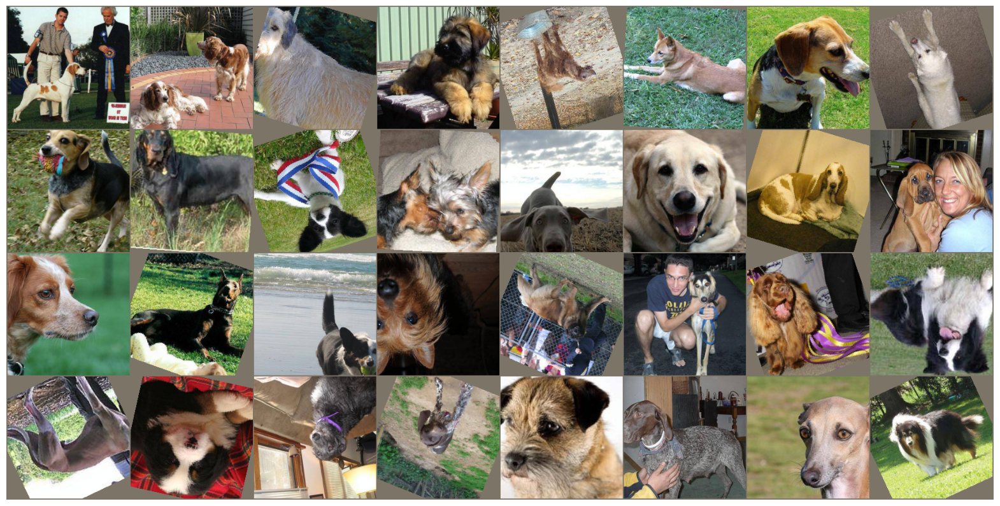

In [54]:
# Получим 1 батч (картинки-метки) из обучающей выборки
inputs, classes = next(iter(dataloaders["train"]))

# Расположим картинки рядом
out = torchvision.utils.make_grid(inputs)
print(*[class_names[x] for x in classes])
imshow(out)

In [14]:
class_names

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenendael',


## Больше данных это тоже регуляризация?

В случае картинок нам поможет аугментация данных. Мы понимаем, что кот может смотреть не только направо, но и налево, получается, что мы можем просто отразить картинку и получить уже новый объект для обучения. Различные аугментации лежат в `torchvision.transforms`. Обычно хорошей практикой является добавление их прямо в метод `__getitem__` вашего датасета. Тогда эти аугментации будут применять при попытке получить картинку. Но что делать, если вы не хотите всегда поворачивать кошку? Можно делать это с заданной вероятностью, и все...

[Примеры](https://pytorch.org/vision/stable/auto_examples/plot_transforms.html#sphx-glr-auto-examples-plot-transforms-py)

In [15]:
perspective_transformer = transforms.RandomPerspective(distortion_scale=0.6, p=1.0)

In [16]:
orig_img = Image.open("train/5eb497aad21ffdfe01e4b9d2c5a01bec.jpg")
perspective_imgs = [perspective_transformer(orig_img) for _ in range(4)]
perspective_imgs = [orig_img] + perspective_imgs

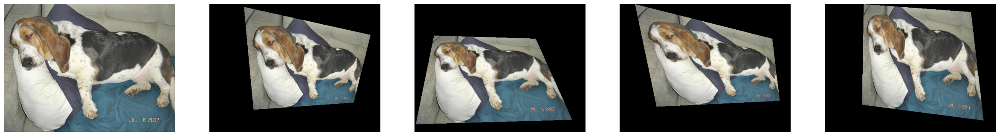

In [17]:
_, axes = plt.subplots(1, 5, figsize=(30, 40))
axes = axes.ravel()

for i in range(5):
    axes[i].imshow(np.array(perspective_imgs[i]))
    axes[i].axis("off")
    
plt.show()

### Важно!!!

Не стоит делать аугментации тестовых (или валидационных данных), только тренировочные.

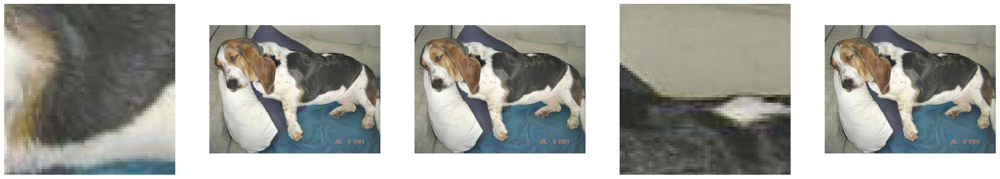

In [18]:
applier = transforms.RandomApply(transforms=[transforms.RandomCrop(size=(64, 64))], p=0.7)

_, axes = plt.subplots(1, 5, figsize=(30, 40))
axes = axes.ravel()

for i in range(5):
    axes[i].imshow(np.array(applier(orig_img)))
    axes[i].axis("off")
    
plt.show()

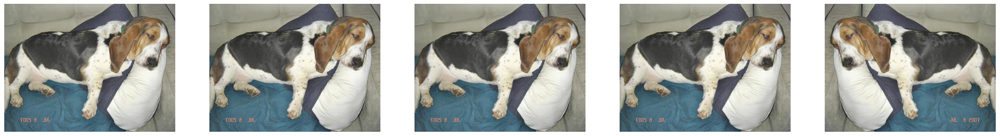

In [19]:
#applier = transforms.RandomApply(transforms=[transforms.RandomCrop(size=(64, 64))], p=0.5)
hflipper = transforms.RandomHorizontalFlip(p=0.7)

_, axes = plt.subplots(1, 5, figsize=(30, 40))
axes = axes.ravel()

for i in range(5):
    axes[i].imshow(np.array(hflipper(orig_img)))
    axes[i].axis("off")
    
plt.show()

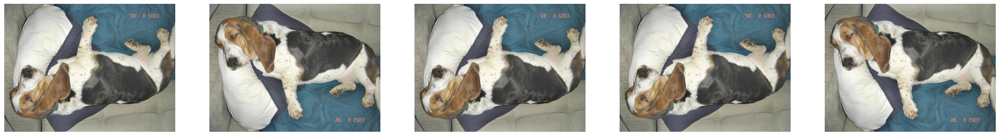

In [20]:
vflipper = transforms.RandomVerticalFlip(p=0.7)

_, axes = plt.subplots(1, 5, figsize=(30, 40))
axes = axes.ravel()

for i in range(5):
    axes[i].imshow(np.array(vflipper(orig_img)))
    axes[i].axis("off")
    
plt.show()

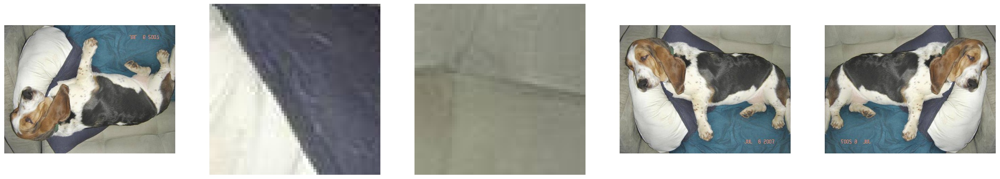

In [21]:
train_transforms = [applier, hflipper, vflipper]

_, axes = plt.subplots(1, 5, figsize=(30, 40))
axes = axes.ravel()

for i in range(5):
    cur_transform = random.choice(train_transforms)
    axes[i].imshow(np.array(cur_transform(orig_img)))
    axes[i].axis("off")
    
plt.show()



## Наконец, используем обученные модели (Fine tunning)

### Очередной раз новая функция для обучения модели

In [22]:
def train_model(model, criterion, optimizer, num_epochs=5):
    best_model_wts = model.state_dict()
    best_acc = 0.0
    
    losses = {"train": [], "val": []}

    for epoch in range(num_epochs):
        # каждая эпоха имеет обучающую и тестовую стадии
        for phase in ["train", "val"]:
            if phase == "train":
                model.train()  # установаить модель в режим обучения
            else:
                model.eval()

            running_loss = 0.0
            running_corrects = 0

            # итерируемся по батчам
            for data in dataloaders[phase]:
                # получаем картинки и метки
                inputs, labels = data
                inputs = inputs.to(DEVICE)
                labels = labels.to(DEVICE)

                # инициализируем градиенты параметров
                if phase == "train":
                    optimizer.zero_grad()

                # forward pass
                if phase == "val":
                    with torch.no_grad():
                        outputs = model(inputs)
                else:
                    outputs = model(inputs)

                preds = torch.argmax(outputs, -1)
                loss = criterion(outputs, labels)

                # backward pass + оптимизируем только если это стадия обучения
                if phase == "train":
                    loss.backward()
                    optimizer.step()

                # статистика
                running_loss += loss.item()
                running_corrects += int(torch.sum(preds == labels.data))

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects / dataset_sizes[phase]
            
            losses[phase].append(epoch_loss)

            print(f"Phase: {phase}, Loss: {epoch_loss}, Accuracy: {epoch_acc}, Epoch: {epoch+1}/{num_epochs}")
            

            # если достиглось лучшее качество, то запомним веса модели
            if phase == "val" and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = model.state_dict()

#        clear_output(wait=True)


    # загрузим лучшие веса модели
    model.load_state_dict(best_model_wts)
    return model, losses

In [23]:
#model = torchvision.models.vgg19_bn(pretrained=True)
from torchvision import models
model = models.vit_l_16(pretrained=True)

/home/oxana/miniconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/oxana/miniconda3/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ViT_L_16_Weights.IMAGENET1K_V1`. You can also use `weights=ViT_L_16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [24]:
model

VisionTransformer(
  (conv_proj): Conv2d(3, 1024, kernel_size=(16, 16), stride=(16, 16))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=1024, out_features=1024, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=1024, out_features=4096, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=4096, out_features=1024, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
       

In [25]:
for param in model.parameters():
    print(param.requires_grad)

True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True
True


In [26]:
# замораживаем параметры (веса)
for param in model.parameters():
    param.requires_grad = False

In [27]:
# получаем нужное количество классов на выходе
num_classifier_feature = model.heads.head.in_features
model.heads.head = nn.Sequential(
    nn.Linear(num_classifier_feature, 120)
)
model = model.to(DEVICE)

In [28]:
for param in model.parameters():
    print(param.requires_grad)

False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
False
Fals

In [29]:
print(f"Number of paramaters: {sum([param.numel() for param in model.parameters() if param.requires_grad])}")

Number of paramaters: 123000


In [30]:
loss_fn = nn.CrossEntropyLoss()
optimizer_ft = torch.optim.Adam(model.parameters(), lr=1e-4)

In [31]:
model, losses = train_model(model, loss_fn, optimizer_ft, num_epochs=5)

Phase: train, Loss: 0.1149440518534124, Accuracy: 0.631099544567339, Epoch: 1/5
Phase: val, Loss: 0.079276451587677, Accuracy: 0.947, Epoch: 1/5
Phase: train, Loss: 0.055839852439015424, Accuracy: 0.9124918672739102, Epoch: 2/5
Phase: val, Loss: 0.03244645619392395, Accuracy: 0.964, Epoch: 2/5
Phase: train, Loss: 0.026336820297245347, Accuracy: 0.9313597918022121, Epoch: 3/5
Phase: val, Loss: 0.015527596950531006, Accuracy: 0.973, Epoch: 3/5
Phase: train, Loss: 0.015703505205244595, Accuracy: 0.9384081544133593, Epoch: 4/5
Phase: val, Loss: 0.009696439281105996, Accuracy: 0.977, Epoch: 4/5
Phase: train, Loss: 0.011821450976235983, Accuracy: 0.9411190631099544, Epoch: 5/5
Phase: val, Loss: 0.007666406750679016, Accuracy: 0.98, Epoch: 5/5


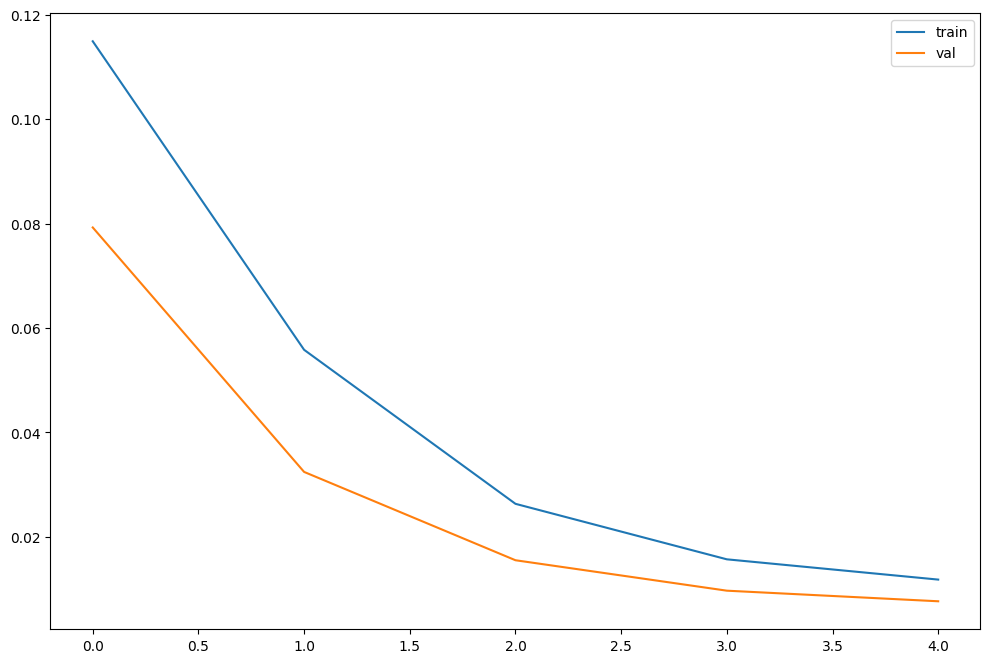

In [32]:
plt.figure(figsize=(12, 8))
plt.plot(losses["train"], label="train")
plt.plot(losses["val"], label="val")
plt.legend()
plt.show()

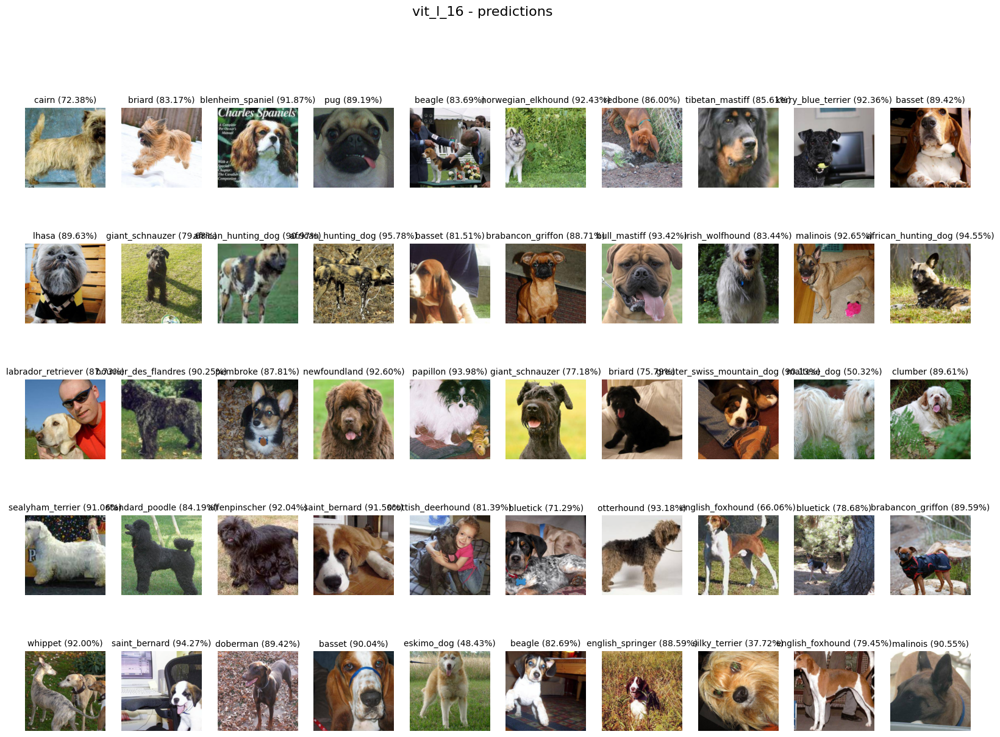

In [81]:
ROW_IMG = 10
N_ROWS = 5

fig = plt.figure(figsize=(20, 14))
indexes = random.sample(range(1000), 50)
for index, place in zip(indexes, range(1, ROW_IMG * N_ROWS + 1)):
    plt.subplot(N_ROWS, ROW_IMG, place)
    plt.axis('off')
    inp = dataloaders["val"].dataset[index][0].numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    
    with torch.no_grad():
        model.cpu().eval()
        probs = torch.softmax(model(dataloaders["val"].dataset[index][0].unsqueeze(0)), dim=1)
        
    title = f"{class_names[torch.argmax(probs).item()]} ({torch.max(probs[0]) * 100:.2f}%)"
    
    plt.title(title, fontsize=10)
fig.suptitle('vit_l_16 - predictions', fontsize=16);

In [ ]:
data_transforms = {
    "train": transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(IMG_SIZE),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
        my_transforms
    ]),
    "val": transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(IMG_SIZE),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = "."
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ["train", "val"]}

dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=BATCH_SIZE,
                                              shuffle=True, num_workers=2)
               for x in ["train", "val"]}
dataset_sizes = {x: len(image_datasets[x]) for x in ["train", "val"]}
class_names = image_datasets["train"].classes

## Посылка

In [225]:
test_images = os.listdir("test")

test_transforms = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(IMG_SIZE),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ])

In [226]:
class TestDataset(Dataset):

    def __init__(self, test_images, transforms):
        self.test_images = test_images
        self.transforms = test_transforms
    
    def __len__(self):
        return len(self.test_images)

    def __getitem__(self, idx):
        name = self.test_images[idx]
        path = os.path.join("./test", name)
        img = Image.open(path)
        img = self.transforms(img)
        return (img, name)

In [227]:
test_dataset = TestDataset(test_images, test_transforms)

In [228]:
test_dataloader = torch.utils.data.DataLoader(
    dataset=test_dataset,
    batch_size=64,
    shuffle=False
)
print(len(test_dataloader))

162


In [229]:
columns = list(pd.read_csv("sample_submission.csv", nrows=1))
columns

['id',
 'affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenen

In [239]:
with torch.no_grad():
    res = []
    for batch_idx, (batch_img, batch_name) in enumerate(test_dataloader):
        batch_name = [name.split(".")[0] for name in batch_name]
        df = pd.DataFrame(columns=columns)
        df["id"] = batch_name
        batch_img = batch_img.to(DEVICE)
        output = model(batch_img)
        sm = nn.functional.softmax(output, dim=1)
        df[columns[1:]] = sm.cpu().numpy()
        res.append(df)
res

[                                  id  affenpinscher  afghan_hound  \
 0   1dbb9c899296b634dab9a43601a66a92       0.000506      0.000578   
 1   6ae4fdf29e4e33b011856409dfc1b0a5       0.000443      0.000696   
 2   53789615849b9f618c279670c859f61c       0.000519      0.000506   
 3   12595290a6be01f4edc990edd1e69a64       0.001129      0.000690   
 4   369b66c149b857c369f839c1a2840e74       0.000517      0.002168   
 ..                               ...            ...           ...   
 59  2145ee14fd428f9474635231483e5480       0.000175      0.000330   
 60  a139581faa6b04f7d4c0e87107e33a01       0.000391      0.000921   
 61  1638e407075b037a3f024fedaaa0953d       0.000449      0.000425   
 62  1de0cc1a40046bcb58400263159597db       0.000988      0.000940   
 63  3860690b488699e05770972d971e9336       0.001048      0.000393   
 
     african_hunting_dog  airedale  american_staffordshire_terrier  \
 0              0.000552  0.000642                        0.000873   
 1              0.

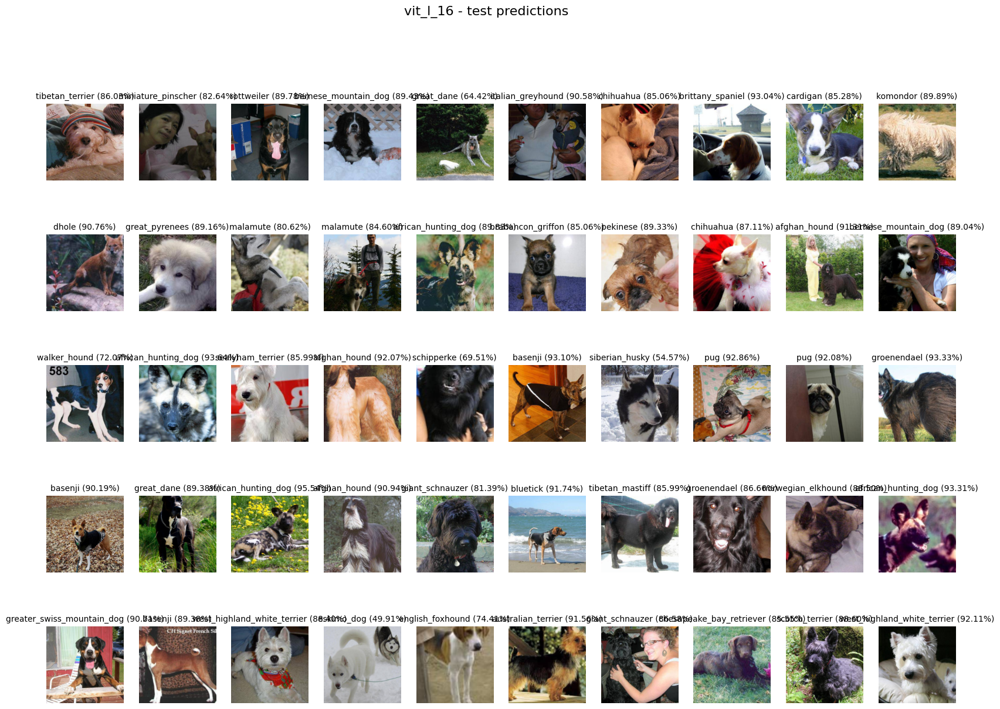

In [245]:
ROW_IMG = 10
N_ROWS = 5

fig = plt.figure(figsize=(20, 14))
indexes = random.sample(range(1000), 50)
for index, place in zip(indexes, range(1, ROW_IMG * N_ROWS + 1)):
    plt.subplot(N_ROWS, ROW_IMG, place)
    plt.axis('off')
    inp = test_dataloader.dataset[index][0].numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    
    with torch.no_grad():
        model.cpu().eval()
        probs = torch.softmax(model(test_dataloader.dataset[index][0].unsqueeze(0)), dim=1)
        
    title = f"{class_names[torch.argmax(probs).item()]} ({torch.max(probs[0]) * 100:.2f}%)"
    
    plt.title(title, fontsize=10)
fig.suptitle('vit_l_16 - test predictions', fontsize=16);

In [241]:
df_submission = pd.concat(res)

In [242]:
import datetime
submission_filename = "submission_{}.csv".format(
    datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S"))
df_submission.to_csv(submission_filename)
print("Файл посылки сохранен как: {}".format(submission_filename))

Файл посылки сохранен как: submission_2023-05-02_19-02-50.csv


In [243]:
# сохраняем модель
torch.save(model.state_dict(), "./model")

In [244]:
torch.save(model, "./model.pb")